# Steps performed for Data Analysis
## 1) Importing relevant libraries
## 2) Load data from file into dataframe
## 3) Check the data in dataframe for initial understanding
## 4) Check dataframe for any noise eg:-NaN values and statistics of data for better understanding
## 5) Cleaning of data 

In [1]:
#Importing the required libraries
import pandas as pd
import seaborn as sns
from xgboost import XGBClassifier
sns.set()

In [2]:
#Load data from csv file to dataframe
df_initial=pd.read_csv('Train.csv')

In [3]:
#Setting max display of rows and columns to None to check full dataframe
pd.options.display.max_rows=None
pd.options.display.max_columns=None
df_initial

,INCIDENT_ID,DATE,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,MULTIPLE_OFFENSE
0,CR_102659,04-JUL-04,0,36,34,2,1,5,6,1,6,1,174,1.0,92,29,36,0
1,CR_189752,18-JUL-17,1,37,37,0,0,11,17,1,6,1,236,1.0,103,142,34,1
2,CR_184637,15-MAR-17,0,3,2,3,5,1,0,2,3,1,174,1.0,110,93,34,1
3,CR_139071,13-FEB-09,0,33,32,2,1,7,1,1,6,1,249,1.0,72,29,34,1
4,CR_109335,13-APR-05,0,33,32,2,1,8,3,0,5,1,174,0.0,112,29,43,1
5,CR_96263,07-APR-03,0,45,45,10,3,1,0,1,6,1,303,1.0,72,62,34,1
6,CR_131400,22-JAN-08,0,30,35,7,3,7,1,0,5,1,174,0.0,112,29,43,1
7,CR_11981,14-MAY-93,0,8,7,7,3,9,8,0,5,1,316,1.0,72,62,34,1
8,CR_184134,21-AUG-16,0,49,49,6,5,8,3,1,1,1,316,1.0,103,14,34,1
9,CR_32634,25-AUG-96,1,4,4,6,5,15,10,0,5,2,145,1.0,103,29,34,0


In [4]:
#Checking information of the columns in dataframe to examine any noise in the columns.Eg:-NaN
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23856 entries, 0 to 23855
Data columns (total 18 columns):
INCIDENT_ID         23856 non-null object
DATE                23856 non-null object
X_1                 23856 non-null int64
X_2                 23856 non-null int64
X_3                 23856 non-null int64
X_4                 23856 non-null int64
X_5                 23856 non-null int64
X_6                 23856 non-null int64
X_7                 23856 non-null int64
X_8                 23856 non-null int64
X_9                 23856 non-null int64
X_10                23856 non-null int64
X_11                23856 non-null int64
X_12                23674 non-null float64
X_13                23856 non-null int64
X_14                23856 non-null int64
X_15                23856 non-null int64
MULTIPLE_OFFENSE    23856 non-null int64
dtypes: float64(1), int64(15), object(2)
memory usage: 3.3+ MB


In [5]:
#Based on the information displayed in above cell column X_12 contains 182 NaN value
#Check numerical statistics of data
df_initial.describe()

,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,X_9,X_10,X_11,X_12,X_13,X_14,X_15,MULTIPLE_OFFENSE
count,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23856.000000,23674.000000,23856.000000,23856.000000,23856.000000,23856.000000
mean,0.483778,24.791206,24.637450,4.276744,2.455609,6.154175,4.876509,0.972460,4.924128,1.244802,206.954519,0.974064,85.237383,72.674296,33.464747,0.955231
std,1.439738,15.240231,15.135093,2.944672,1.963095,4.471756,3.881931,1.453144,1.362625,1.119301,93.033348,1.167725,27.597226,43.297320,8.386834,0.206800
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,7.000000,8.000000,2.000000,1.000000,3.000000,2.000000,0.000000,5.000000,1.000000,174.000000,1.000000,72.000000,29.000000,34.000000,1.000000
50%,0.000000,24.000000,24.000000,4.000000,3.000000,5.000000,4.000000,1.000000,5.000000,1.000000,249.000000,1.000000,98.000000,62.000000,34.000000,1.000000
75%,0.000000,36.000000,35.000000,6.000000,5.000000,8.000000,7.000000,1.000000,6.000000,1.000000,249.000000,1.000000,103.000000,107.000000,34.000000,1.000000
max,7.000000,52.000000,52.000000,10.000000,5.000000,19.000000,18.000000,99.000000,6.000000,90.000000,332.000000,90.000000,116.000000,142.000000,50.000000,1.000000


### Cleaning data and create X(input values ) and Y (output values) for training model

In [6]:
# There are two ways to handle NaN data 
# 1) Delete the rows containing NaN values if number of NaN values is less than 1% of the total number of rows.
# 2) Fill the NaN Values using fillna() function , we have different option either use ffill method or use custom method as argument
#    for fillna() function


# Filling NaN value with median value of the respective column
# median is choosed over mean value to reduce the effect of oultiers in data

df_initial=df_initial.fillna(df_initial.median())

In [7]:
#Setting Y and X for training the model
Y=df_initial['MULTIPLE_OFFENSE']

In [8]:
#Checking columns name in dataframe
df_initial.columns

Index(['INCIDENT_ID', 'DATE', 'X_1', 'X_2', 'X_3', 'X_4', 'X_5', 'X_6', 'X_7',
       'X_8', 'X_9', 'X_10', 'X_11', 'X_12', 'X_13', 'X_14', 'X_15',
       'MULTIPLE_OFFENSE'],
      dtype='object')

In [9]:
X=df_initial[['X_1', 'X_2', 'X_3', 'X_4', 'X_5', 'X_6', 'X_7',
       'X_8', 'X_9', 'X_10', 'X_11', 'X_12', 'X_13', 'X_14', 'X_15']]

# Top 2 choices of alogrithm to use for this problem are:
## 1) Random Forest
## 2) Gradient boosting (xgboost)

## Random Forest :
## Pros:
### 1) RF algorithm is easy to tune as optimization is done in parameter space
### 2) Training time for RF is less as compared to GB
### 3) RF is less likely to overfit than GB if data is noisy
## Cons:
### 1) If number of decision trees are more than prdiction time is more as compared to GB

## Gradient Boosting :
## Pros:
### 1) GB works very well on unbalanced data as compared to RF
### 2) It performs the optimization in function space which makes use of custom loss functions much easier
## Cons:
### 1) If data contains noise then chances of overfitting will increase.
### 2) More training time as compared to RF.

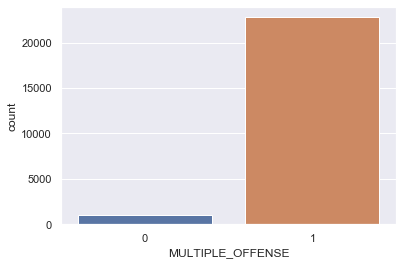

In [10]:
#To check in training set which output is more or in other terms how well data is balanced
sns.countplot(x='MULTIPLE_OFFENSE',data=df_initial)

### As data is unbalanced so gradient boosting algorithm will works best for this case

In [11]:
# Instantiate XGBClassifier
model_xgboost=XGBClassifier()

In [12]:
# Training model on train data X and Y
model_xgboost.fit(X,Y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [13]:
#Reading test data
df_test_initial=pd.read_csv('Test.csv')

In [14]:
#Filling NaN value with median value of the column
df_test_initial=df_test_initial.fillna(df_test_initial.median())

In [15]:
#test_X dataframe for passing as a input to model
test_X=df_test_initial[['X_1', 'X_2', 'X_3', 'X_4', 'X_5', 'X_6', 'X_7',
       'X_8', 'X_9', 'X_10', 'X_11', 'X_12', 'X_13', 'X_14', 'X_15']]

In [16]:
#Making prediction using test data
predication_xg=model_xgboost.predict(test_X)

In [17]:
#Preparing dataframe for writing into csv file
df_data_Set_xg=pd.DataFrame(df_test_initial['INCIDENT_ID'])
predication_xg_df=pd.DataFrame(predication_xg)
df_data_Set_xg['MULTIPLE_OFFENSE']=predication_xg_df

In [18]:
#Writing data into .csv file
df_data_Set_xg.to_csv('submission_xg1.csv',index=False)